In [97]:
import os

import tqdm
import torch
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import seaborn

import vari
import vari.datasets
import vari.models
import vari.inference

from vari.layers import GaussianLayer, BernoulliLayer

from sklearn.datasets import make_circles

In [98]:
experiments_dir = '/nas/experiments/sacred/models/'
output_dir = f'{os.getcwd()}/plots'
plot_ext = '.svg'
mpl.style.use('default')

In [99]:
def get_constant_colormap(rgb_color):
    # Colormap that is constant at the given rgb_color.
    r, g, b = rgb_color
    cdict = {'red': [(0, r, r), (1, r, r)], 
             'green': [(0, g, g), (1, g, g)],
             'blue': [(0, b, b), (1, b, b)]}
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

## Select models and data

In [100]:
run_ids_moons = {
    '7013': 7013,
    '7050': 7050,
}

run_ids_spirals = {
    '7073': 7073,
    '7094': 7094,
    '7080': 7080,
    '7082': 7082,
}

## Get data

In [101]:
def get_spirals(noise):
    train_dataset = vari.datasets.Spirals(n_samples=10000, noise=noise, rotation=0, start_radius=np.pi, rounds=1)
    x_train = train_dataset.examples
    y_train = train_dataset.labels
    y_train = np.argmax(y_train, -1)
    y_train_onehot = np.eye(2)[y_train]
    
    test1_dataset = vari.datasets.Spirals(n_samples=10000, noise=noise, rotation=np.pi/2, start_radius=0, rounds=1.5)
    x_test1 = test1_dataset.examples
    y_test1 = test1_dataset.labels
    y_test1 = np.argmax(y_test1, -1)
    y_test1_onehot = np.eye(2)[y_test1]
    
    return x_train, y_train, x_test1, y_test1

In [102]:
def get_moons(noise, test_scale=1.15):
    train_dataset = vari.datasets.Moons(n_samples=10000, noise=noise)
    x_train = train_dataset.examples
    y_train = train_dataset.labels.argmax(axis=-1)

    # TEST1 IS EACH MOON SHRUNK BY A FACTOR test_scale AROUND ITS SYMMETRICAL CENTER
    test1_dataset = vari.datasets.Moons(n_samples=10000, noise=noise*test_scale, seed=2)
    x_test1 = test1_dataset.examples
    y_test1 = test1_dataset.labels.argmax(axis=-1)
    x_test1[y_test1==0] = (x_test1[y_test1==0] - np.array([0.0, 0.0])) / test_scale + np.array([0.0, 0.0])
    x_test1[y_test1==1] = (x_test1[y_test1==1] - np.array([1.0, 0.5])) / test_scale + np.array([1.0, 0.5])

    return x_train, y_train, x_test1, y_test1

In [103]:
moons, spirals = dict(), dict()
moons['x_train'], moons['y_train'], moons['x_test1'], moons['y_test1'] = get_moons(noise=0.00, test_scale=1.05)
spirals['x_train'], spirals['y_train'], spirals['x_test1'], spirals['y_test1'] = get_spirals(noise=0.00)

### Compute meshgrid

In [104]:
def make_meshgrid(x_lim, y_lim, nx=50, ny=50):
    """Returns a meshgrid over the 2D range specified by x_lim and y_lim"""
    x = np.linspace(*x_lim, nx)
    y = np.linspace(*y_lim, ny)
    xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
    x_meshgrid = []
    for i in range(nx):   
        for j in range(ny):
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if not i == 0:
                x_meshgrid += [[xv[j,i-1], yv[j,i-1]]]
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if not j == 0:
                x_meshgrid += [[xv[j-1,i], yv[j-1,i]]]
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if j == ny-1:
                for k in range(ny):
                    x_meshgrid += [[xv[ny-(k+1),i], yv[ny-(k+1),i]]]

    return np.array(x_meshgrid)

In [105]:
for dataset in [moons, spirals]:
    x_min = np.min([dataset['x_train'][:,0].min(), dataset['x_test1'][:,0].min()])
    x_max = np.max([dataset['x_train'][:,0].max(), dataset['x_test1'][:,0].max()])
    y_min = np.min([dataset['x_train'][:,1].min(), dataset['x_test1'][:,1].min()])
    y_max = np.max([dataset['x_train'][:,1].max(), dataset['x_test1'][:,1].max()])

    dataset['meshgrid'] = make_meshgrid(
        x_lim=(x_min, x_max),
        y_lim=(y_min, y_max),
        nx=50,
        ny=50
    )
    x_train_meshgrid_medium = make_meshgrid(
        x_lim=(x_min - 0.5*np.abs(x_min), x_max + 0.5*np.abs(x_max)),
        y_lim=(y_min - 0.5*np.abs(y_min), y_max + 0.5*np.abs(y_max)),
        nx=150,
        ny=150
    )
    x_train_meshgrid_large = make_meshgrid(
        x_lim=(x_min - np.abs(x_min * 3), x_max + np.abs(x_max * 3)),
        y_lim=(y_min - np.abs(y_min * 3), y_max + np.abs(y_max * 3)),
        nx=150,
        ny=150
    )

### Visualize dataset

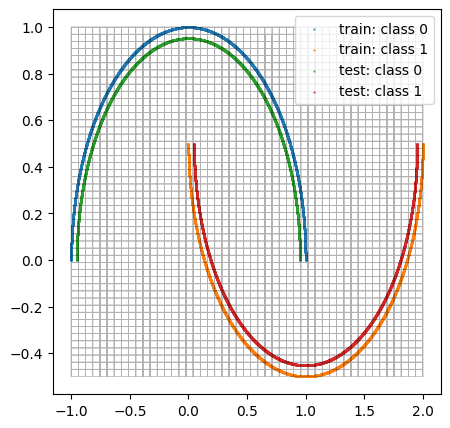

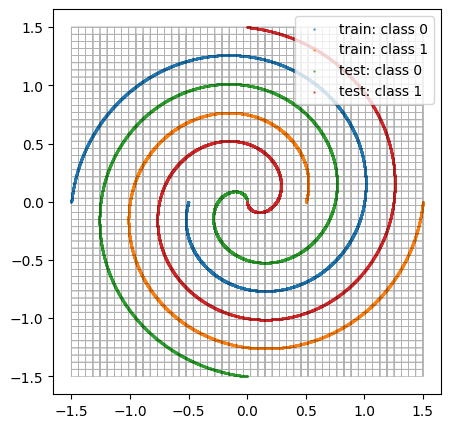

In [106]:
for name, dataset in zip(['Moons', 'Spirals'], [moons, spirals]):
    fig, ax1 = plt.subplots(1, 1, figsize=(5, 5))
    x_train, y_train, x_test1, y_test1 = dataset['x_train'], dataset['y_train'], dataset['x_test1'], dataset['y_test1']
    ax1.plot(dataset['meshgrid'][:,0], dataset['meshgrid'][:,1], c="black", alpha=.3, linewidth=.5)
    ax1.scatter(x_train[y_train==0,0], x_train[y_train==0,1], alpha=0.7, s=0.5, c='C0', label="train: class 0")
    ax1.scatter(x_train[y_train==1,0], x_train[y_train==1,1], alpha=0.7, s=0.5, c='C1', label="train: class 1")
    ax1.scatter(x_test1[y_test1==0,0], x_test1[y_test1==0,1], alpha=0.7, s=0.5, c='C2', label="test: class 0")
    ax1.scatter(x_test1[y_test1==1,0], x_test1[y_test1==1,1], alpha=0.7, s=0.5, c='C3', label="test: class 1")
    ax1.legend()
    fig.show()
    fig.savefig(output_dir + f'/Dataset_{name}' + plot_ext, bbox_inches='tight')

### Euclidean distance between datasets

In [107]:
def nearest_neighbour_distance(xy1, xy2):
    # Euclidean distance matrix (broadcasting along newaxis)
    euc_dist_mat = np.sqrt(np.sum((xy1[:, np.newaxis, :] - xy2[np.newaxis, :, :]) ** 2, axis=-1))
    euc_dist_mat[euc_dist_mat == 0] = np.nan  # Set diagonal to NaNs
    return np.nanmin(euc_dist_mat, axis=-1)  # Minimum ignoring NaNs

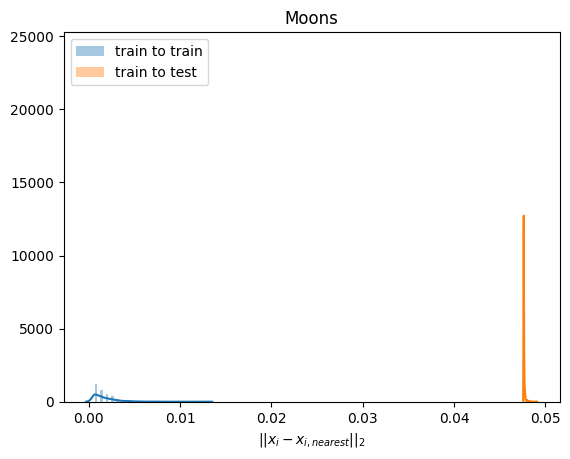

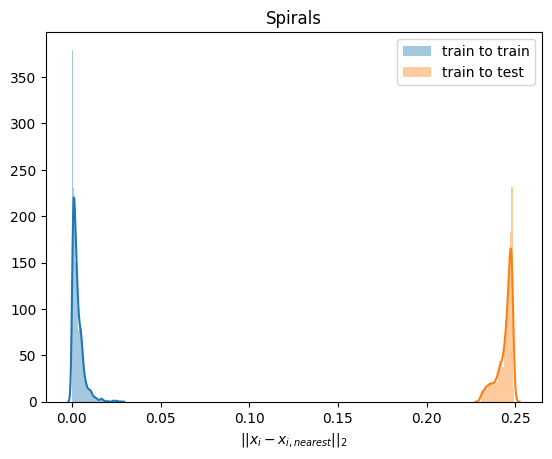

In [108]:
n_samples = 2000

nnd_train = nearest_neighbour_distance(moons['x_train'][:n_samples], moons['x_train'][:n_samples])
nnd_test1 = nearest_neighbour_distance(moons['x_train'][:n_samples], moons['x_test1'][:n_samples])
fig, ax = plt.subplots(1, 1)
seaborn.distplot(nnd_train, ax=ax, label='train to train')
seaborn.distplot(nnd_test1, ax=ax, label='train to test')
ax.set_title('Moons')
ax.set_xlabel('$||x_i - x_{i, nearest}||_2$')
ax.legend()
fig.savefig(output_dir + '/DataDistance_Moons' + plot_ext, bbox_inches='tight')

nnd_train = nearest_neighbour_distance(spirals['x_train'][:n_samples], spirals['x_train'][:n_samples])
nnd_test1 = nearest_neighbour_distance(spirals['x_train'][:n_samples], spirals['x_test1'][:n_samples])
fig, ax = plt.subplots(1, 1)
seaborn.distplot(nnd_train, ax=ax, label='train to train')
seaborn.distplot(nnd_test1, ax=ax, label='train to test')
ax.set_title('Spirals')
ax.set_xlabel('$||x_i - x_{i, nearest}||_2$')
ax.legend();
fig.savefig(output_dir + '/DataDistance_Spirals' + plot_ext, bbox_inches='tight')

In the plots above we have computed the Euclidean distance between $\mathbf{x}=[x_1,x_2]^T$ coordinates/vectors from the Moons training set to the train/test set $||x_{train, i} - x_{test, j}||^2$. In the result Euclidean distance matrix, we find the smallest (nonzero) distance and plot the distribution.

We clearly observe that with the given amount of noise, the test set is easily separable from the training set by thresholding the distance from the nearest training set coordinate.

## Load models

In [109]:
def load_models(run_ids):
    models = dict()
    for model_abbr, run_id in run_ids.items():
        run_id = str(run_id)

        model = vari.models.HierarchicalVariationalAutoencoder
        # Load the saved kwargs
        kwargs = torch.load(
            os.path.join(experiments_dir, run_id, 'model_kwargs.pkl'),
            map_location=torch.device('cpu')
        )
        model = model(**kwargs)

        try:
            model.load_state_dict(torch.load(
                os.path.join(experiments_dir, run_id, 'model_state_dict.pkl'),
                map_location=torch.device('cpu')
            ))
            models[model_abbr] = model
            print(f'Loaded ID {run_id} {model_abbr.upper()} ')
        except Exception as exc:
            print(f'Failed loading {model_abbr.upper()} ID {run_id}')
            print(exc)
            models[model_abbr] = None
    return models

In [111]:
print('Moons')
models_moons = load_models(run_ids_moons)
print('Spirals')
models_spirals = load_models(run_ids_spirals)

Moons
Loaded ID 7013 7013 
Loaded ID 7050 7050 
Spirals
Loaded ID 7073 7073 
Loaded ID 7094 7094 
Loaded ID 7080 7080 
Loaded ID 7082 7082 


## Visualize latent space

In [112]:
constant_cmap = get_constant_colormap((0.2, 0.2, 0.2))

def plot_vectors_and_mesh(vectors, mesh=None, fig=None, ax=None, figsize=(20, 20), color='C0', alpha=0.4, label='train', label_ids=None):
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(1, 1, 1)
    
    if mesh is not None:
        ax.plot(mesh[:,0], mesh[:,1], c='black', alpha=.2, linewidth=.5)
        ax.scatter(mesh[:,0], mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
    if label_ids is not None:
        for i in np.unique(label_ids):
            ax.scatter(vectors[label_ids==i, 0], vectors[label_ids==i, 1], c=f'C{i}', alpha=alpha, label=f"{label}:class{i}")
    else:
        ax.scatter(vectors[:,0], vectors[:,1], c=color, alpha=alpha, label=label)
    #ax1.scatter(vae_qz_mu_x2[:,0], vae_qz_mu_x2[:,1], c=[test1_0], alpha=0.4, label="test1")
    # ax1.axis('off')
    ax.legend()
    return fig, ax

### Moons

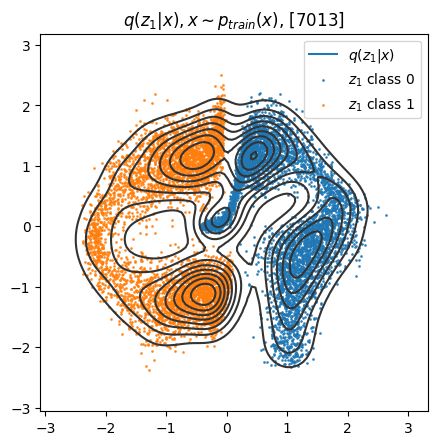

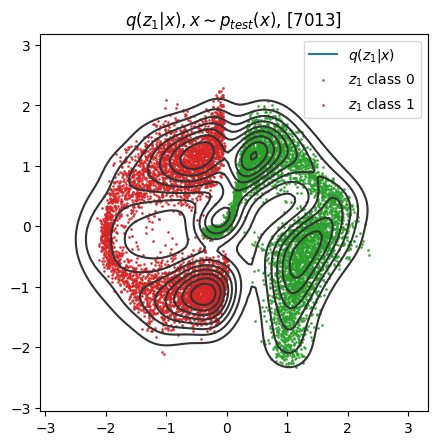

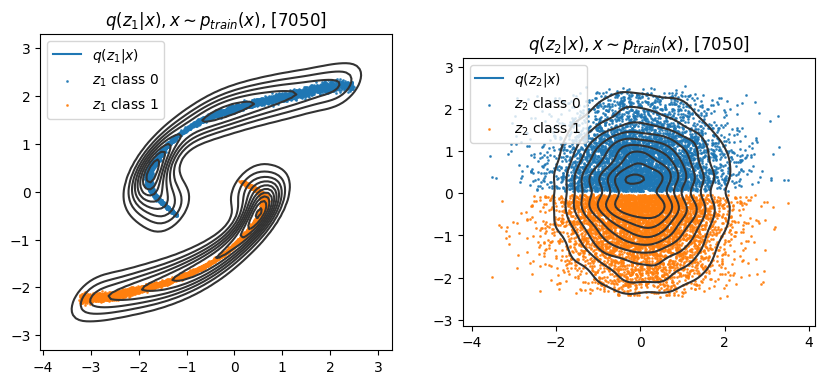

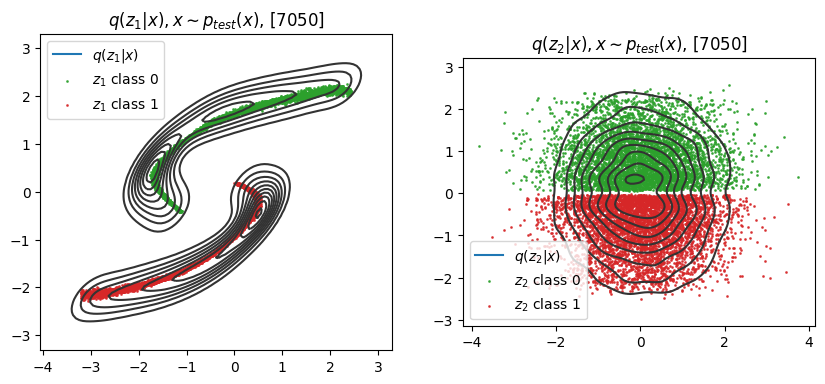

In [68]:
dataset = moons
models = models_moons

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
meshgrid = dataset['meshgrid']

for abbr, model in models.items():
    torch.manual_seed(1)
    with torch.no_grad():
        latents_train = model.encode(torch.FloatTensor(x_train))
        latents_test1 = model.encode(torch.FloatTensor(x_test1))
        latents_meshg = model.encode(torch.FloatTensor(meshgrid))

    n_cols = len(latents_train.keys())
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5))
    if n_cols == 1:
        axes = [axes]
    for i, name in enumerate(latents_train.keys(), start=1):
        qz_train = latents_train[name][0].squeeze()
        qz_mu_train = latents_train[name][1].mean.squeeze()

        axes[i - 1].set_title(f'$q(z_{i}|x), x\sim p_{{train}}(x)$, [{abbr.upper()}]')
        for c in set(y_train):
            axes[i - 1].scatter(qz_train[y_train==c, 0].numpy(),
                        qz_train[y_train==c, 1].numpy(),
                        marker='o', s=1, alpha=0.8, color=f'C{c}', label=f'$z_{i}$ class {c}')
        seaborn.kdeplot(qz_train[:, 0].numpy(),
                        qz_train[:, 1].numpy(),
                        shade=False, cmap=constant_cmap, label=f'$q(z_{i}|x)$', ax=axes[i - 1])
        axes[i - 1].set_aspect('equal')
        axes[i - 1].legend()
    fig.savefig(output_dir + f'/Moons_LatentSpace_train_ID{abbr}' + plot_ext, bbox_inches='tight')

    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5))
    if n_cols == 1:
        axes = [axes]
    for i, name in enumerate(latents_train.keys(), start=1):
        qz_train = latents_train[name][0].squeeze()
        qz_mu_train = latents_train[name][1].mean.squeeze()
        qz_test1 = latents_test1[name][0].squeeze()
        qz_mu_test1 = latents_test1[name][1].mean.squeeze()

        axes[i - 1].set_title(f'$q(z_{i}|x), x\sim p_{{test}}(x)$, [{abbr.upper()}]')
        for c in set(y_test1):
            axes[i - 1].scatter(qz_test1[y_test1==c, 0].numpy(),
                        qz_test1[y_test1==c, 1].numpy(),
                        marker='o', s=1, alpha=0.8, color=f'C{c+2}', label=f'$z_{i}$ class {c}')
        seaborn.kdeplot(qz_train[:, 0].numpy(),
                        qz_train[:, 1].numpy(),
                        shade=False, cmap=constant_cmap, label=f'$q(z_{i}|x)$', ax=axes[i - 1])
        axes[i - 1].set_aspect('equal')
        axes[i - 1].legend()
    fig.savefig(output_dir + f'/Moons_LatentSpace_test_ID{abbr}' + plot_ext, bbox_inches='tight')


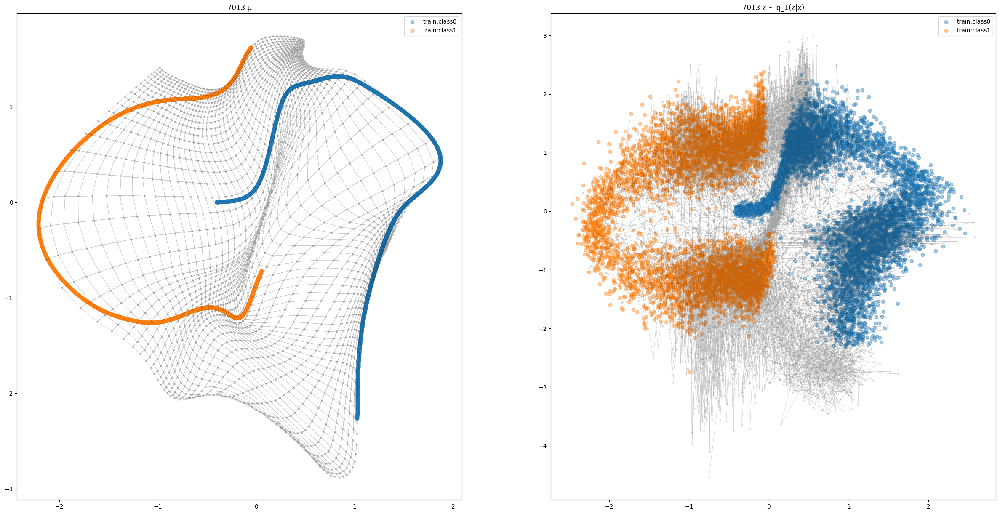

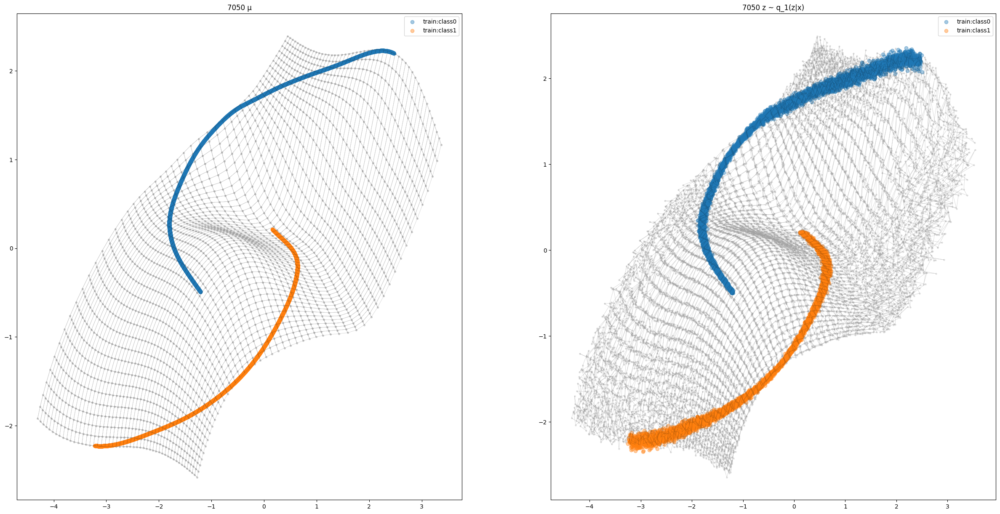

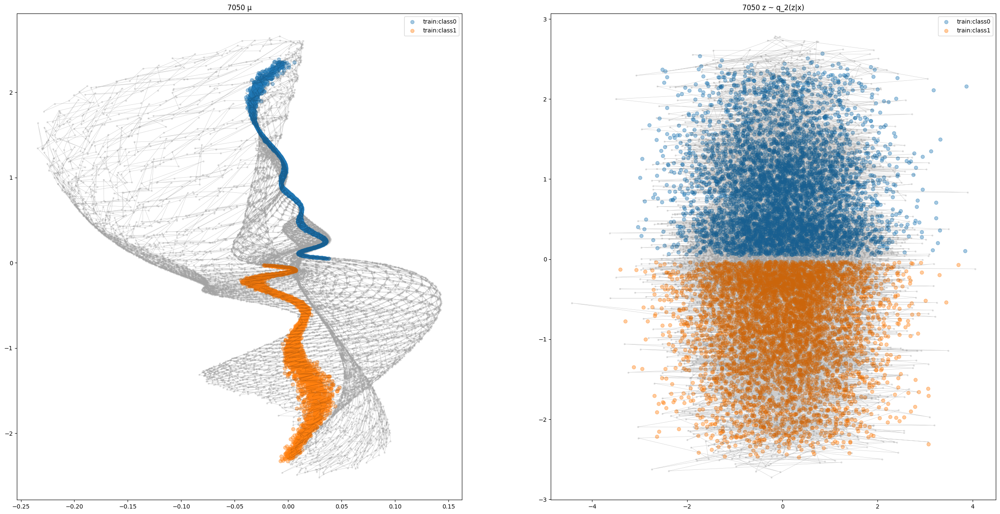

In [18]:
for abbr, model in models.items():
    with torch.no_grad():
        latents_train = model.encode(torch.FloatTensor(x_train))
        latents_test1 = model.encode(torch.FloatTensor(x_test1))
        latents_meshg = model.encode(torch.FloatTensor(meshgrid))

    for i_layer, name in enumerate(latents_train.keys(), start=1):
        qz_x_train = latents_train[name][0].squeeze()
        qz_mu_x_train = latents_train[name][1].mean.squeeze()
        qz_mesh = latents_meshg[name][0].squeeze()
        qz_mu_mesh = latents_meshg[name][1].mean.squeeze()

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
        plot_vectors_and_mesh(qz_mu_x_train, qz_mu_mesh, label_ids=y_train, ax=ax1)
        plot_vectors_and_mesh(qz_x_train, qz_mesh, label_ids=y_train, ax=ax2)
        ax1.set_title(f'{abbr.upper()} µ')
        ax2.set_title(f'{abbr.upper()} z ~ q_{i_layer}(z|x)')
        plt.show()

### Spirals

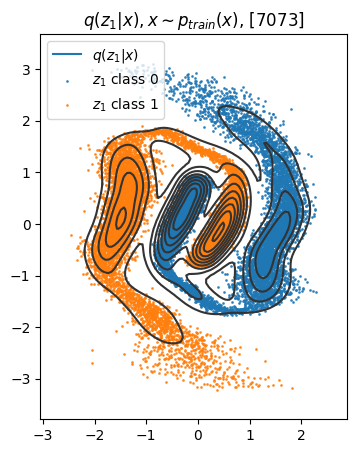

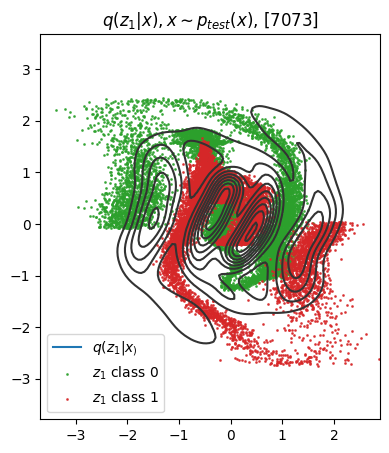

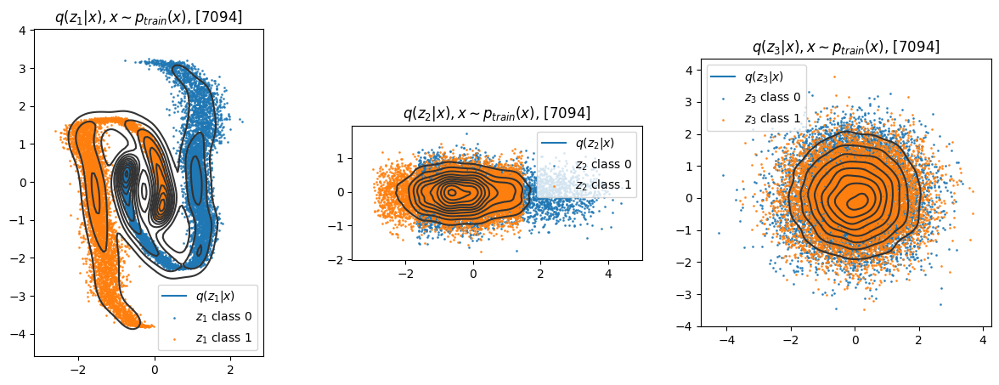

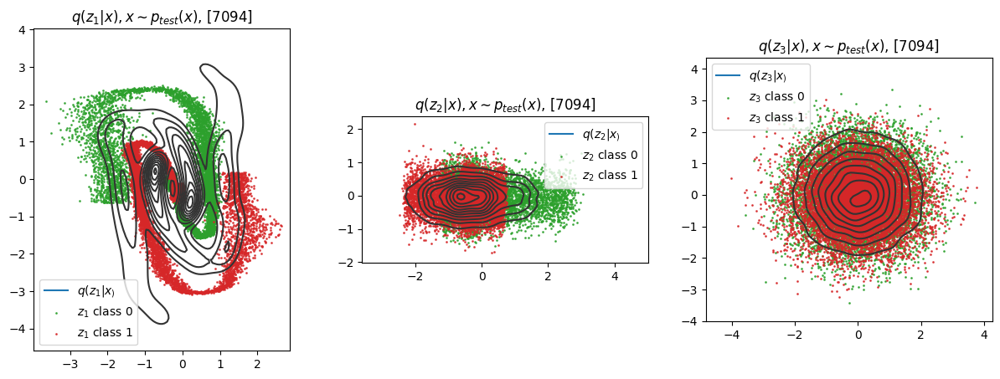

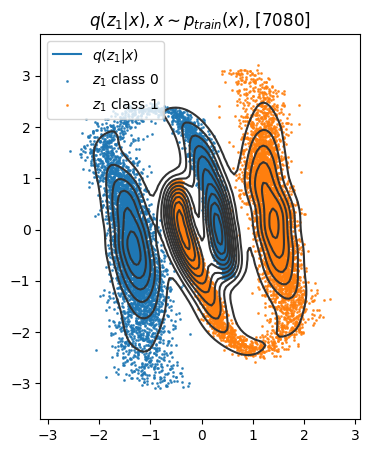

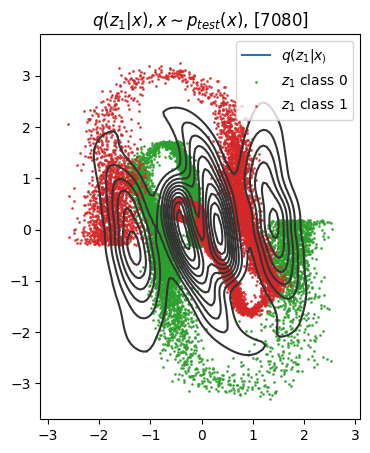

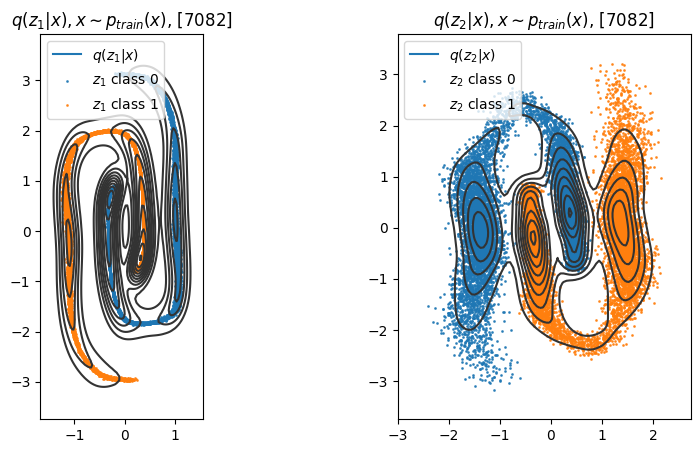

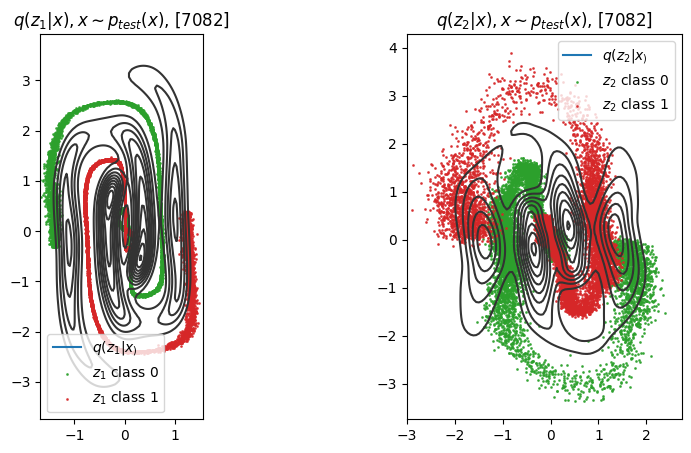

In [113]:
dataset = spirals
models = models_spirals

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
meshgrid = dataset['meshgrid']

for abbr, model in models.items():
    torch.manual_seed(0)
    with torch.no_grad():
        latents_train = model.encode(torch.FloatTensor(x_train))
        latents_test1 = model.encode(torch.FloatTensor(x_test1))
        latents_meshg = model.encode(torch.FloatTensor(meshgrid))

    n_cols = len(latents_train.keys())
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5))
    if n_cols == 1:
        axes = [axes]
    for i, name in enumerate(latents_train.keys(), start=1):
        qz_train = latents_train[name][0].squeeze()
        qz_mu_train = latents_train[name][1].mean.squeeze()

        axes[i - 1].set_title(f'$q(z_{i}|x), x\sim p_{{train}}(x)$, [{abbr.upper()}]')
        for c in set(y_train):
            axes[i - 1].scatter(qz_train[y_train==c, 0].numpy(),
                        qz_train[y_train==c, 1].numpy(),
                        marker='o', s=1, alpha=0.8, color=f'C{c}', label=f'$z_{i}$ class {c}')
        seaborn.kdeplot(qz_train[:, 0].numpy(),
                        qz_train[:, 1].numpy(),
                        shade=False, cmap=constant_cmap, label=f'$q(z_{i}|x)$', ax=axes[i - 1])
        axes[i - 1].set_aspect('equal')
        axes[i - 1].legend()
    fig.savefig(output_dir + f'/Spirals_LatentSpace_q(z{i})_train_ID{abbr}' + plot_ext, bbox_inches='tight')

    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5))
    if n_cols == 1:
        axes = [axes]
    for i, name in enumerate(latents_train.keys(), start=1):
        qz_train = latents_train[name][0].squeeze()
        qz_mu_train = latents_train[name][1].mean.squeeze()
        qz_test1 = latents_test1[name][0].squeeze()
        qz_mu_test1 = latents_test1[name][1].mean.squeeze()

        axes[i - 1].set_title(f'$q(z_{i}|x), x\sim p_{{test}}(x)$, [{abbr.upper()}]')
        for c in set(y_test1):
            axes[i - 1].scatter(qz_test1[y_test1==c, 0].numpy(),
                        qz_test1[y_test1==c, 1].numpy(),
                        marker='o', s=1, alpha=0.8, color=f'C{c+2}', label=f'$z_{i}$ class {c}')
        seaborn.kdeplot(qz_train[:, 0].numpy(),
                        qz_train[:, 1].numpy(),
                        shade=False, cmap=constant_cmap, label=f'$q(z_{i}|x_)$', ax=axes[i - 1])
        axes[i - 1].set_aspect('equal')
        axes[i - 1].legend()
    fig.savefig(output_dir + f'/Spirals_LatentSpace_q(z{i})_test_ID{abbr}' + plot_ext, bbox_inches='tight')



In [ ]:
for abbr, model in models.items():
    with torch.no_grad():
        latents_train = model.encode(torch.FloatTensor(x_train))
        latents_test1 = model.encode(torch.FloatTensor(x_test1))
        latents_meshg = model.encode(torch.FloatTensor(meshgrid))

    for i_layer, name in enumerate(latents_train.keys(), start=1):
        qz_x_train = latents_train[name][0].squeeze()
        qz_mu_x_train = latents_train[name][1].mean.squeeze()
        qz_mesh = latents_meshg[name][0].squeeze()
        qz_mu_mesh = latents_meshg[name][1].mean.squeeze()

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
        plot_vectors_and_mesh(qz_mu_x_train, qz_mu_mesh, label_ids=y_train, ax=ax1)
        plot_vectors_and_mesh(qz_x_train, qz_mesh, label_ids=y_train, ax=ax2)
        ax1.set_title(f'{abbr.upper()} µ')
        ax2.set_title(f'{abbr.upper()} z ~ q_{i_layer}(z|x)')
        plt.show()

## Visualize reconstruction and sampling

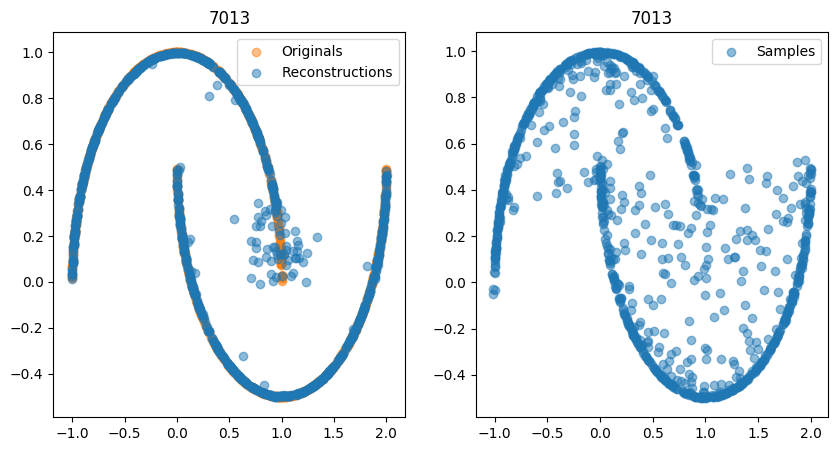

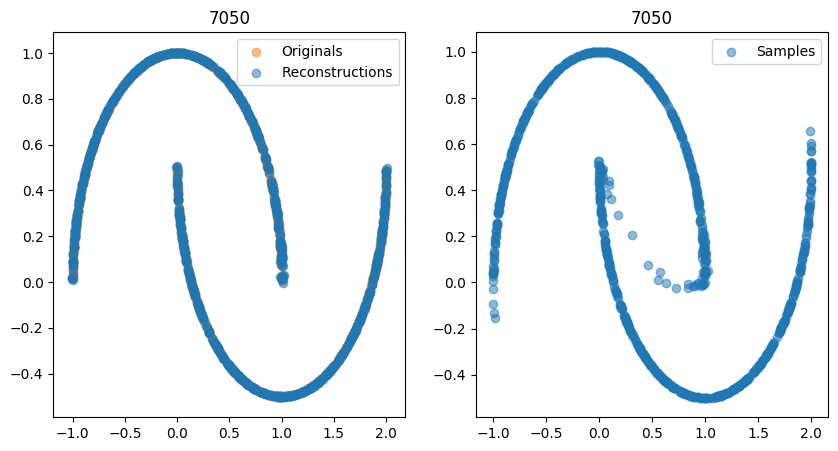

In [114]:
dataset = moons
models = models_moons

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
meshgrid = dataset['meshgrid']

n_samples = 1000

p_z_samples = torch.randn((n_samples, 2))
x_originals = torch.FloatTensor(x_train[:n_samples, :])

for abbr, model in models.items():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    
    with torch.no_grad():
        px_reconstructions = model(x_originals)
        
    plot_vectors_and_mesh(x_originals, alpha=0.5, color='C1', label='Originals', ax=ax1)
    plot_vectors_and_mesh(px_reconstructions.mean.squeeze(), alpha=0.5, label='Reconstructions', ax=ax1)
    ax.set_title(abbr)

    with torch.no_grad():
        px_samples = model.generate(z=p_z_samples)
        
    plot_vectors_and_mesh(px_samples.mean.squeeze(), alpha=0.5, label='Samples', ax=ax2)
#    seaborn.kdeplot(px_samples.mean[..., 0].squeeze().numpy(),
#                    px_samples.mean[..., 1].squeeze().numpy(),
#                    shade=False, cmap=constant_cmap, label=f'KDE', ax=ax2)
    ax1.set_title(abbr)
    ax2.set_title(abbr)
    fig.savefig(output_dir + f'/Moons_SampleReconstruct_ID{abbr}' + plot_ext, bbox_inches='tight')

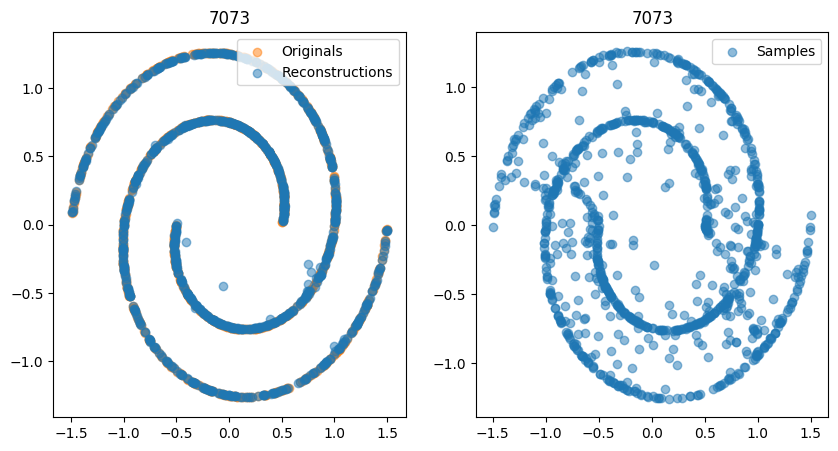

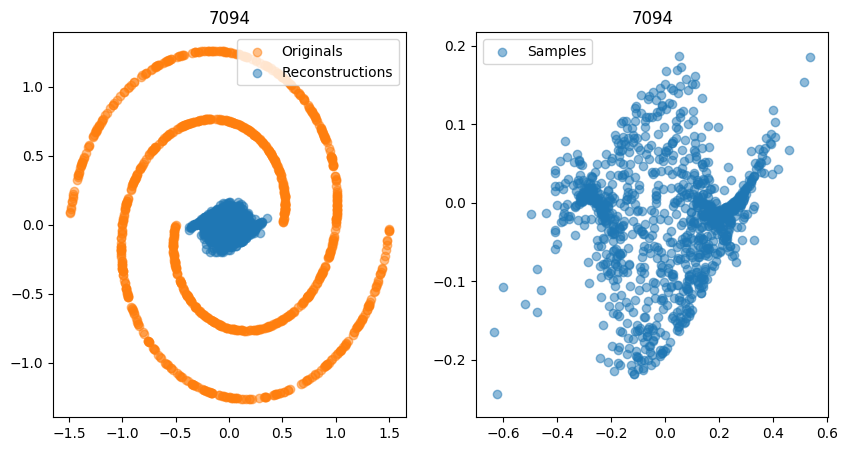

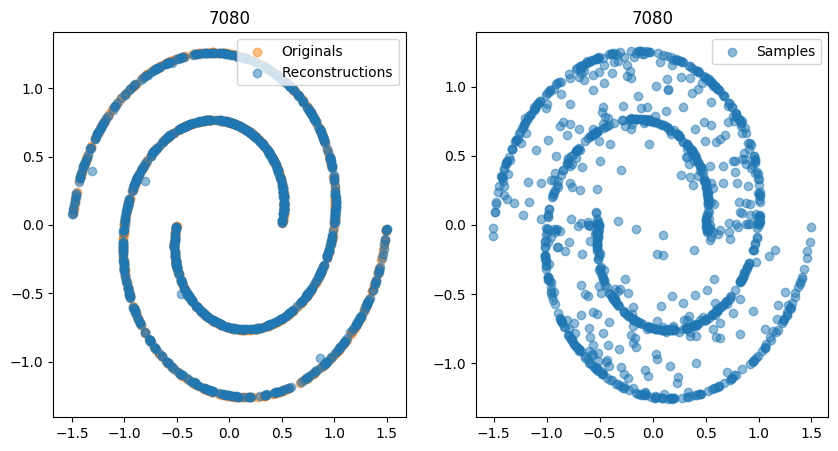

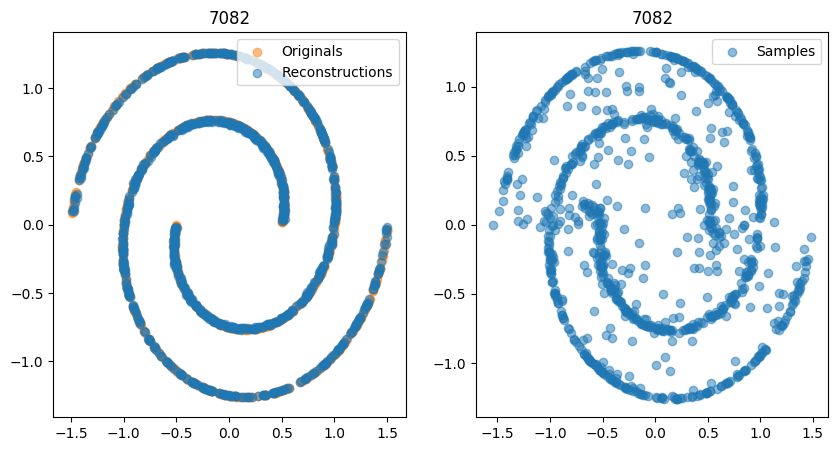

In [62]:
dataset = spirals
models = models_spirals

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
meshgrid = dataset['meshgrid']

n_samples = 1000

p_z_samples = torch.randn((n_samples, 2))
x_originals = torch.FloatTensor(x_train[:n_samples, :])

for abbr, model in models.items():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    
    with torch.no_grad():
        px_reconstructions = model(x_originals)
        
    plot_vectors_and_mesh(x_originals, alpha=0.5, color='C1', label='Originals', ax=ax1)
    plot_vectors_and_mesh(px_reconstructions.mean.squeeze(), alpha=0.5, label='Reconstructions', ax=ax1)
    ax.set_title(abbr)

    with torch.no_grad():
        px_samples = model.generate(z=p_z_samples)
        
    plot_vectors_and_mesh(px_samples.mean.squeeze(), alpha=0.5, label='Samples', ax=ax2)
    ax1.set_title(abbr)
    ax2.set_title(abbr)
    fig.savefig(output_dir + f'/Spirals_SampleReconstruct_ID{abbr}' + plot_ext, bbox_inches='tight')

## Visualize ELBO

In [61]:
def compute_elbo_grid(model, x_lim, y_lim, importance_samples=10, zoom=0, nx=500, ny=500):
    (x_min, x_max), (y_min, y_max) = x_lim, y_lim
    x = np.linspace(x_min - np.abs(x_min * zoom), x_max + np.abs(x_max * zoom), nx)
    y = np.linspace(y_min - np.abs(y_min * zoom), y_max + np.abs(y_max * zoom), ny)
    xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
    zv = np.zeros(xv.shape)
    with torch.no_grad():
        for j in tqdm.tqdm(range(x.shape[0])):
            inp = np.append(xv[:, j:j+1], yv[:, j:j+1], axis=1)
            inp = torch.FloatTensor(inp)
            elbo, kl, likelihood = model.elbo(inp, importance_samples=importance_samples)
            zv[:, j] = elbo.flip(0)
    return zv

  0%|          | 0/500 [00:00<?, ?it/s]

7013 1L E=1000


100%|██████████| 500/500 [00:40<00:00, 12.24it/s]


7029 2L E=1000


  0%|          | 0/500 [00:00<?, ?it/s]

7017 1L E=5000


  0%|          | 0/500 [00:00<?, ?it/s]

7033 2L E=5000


100%|██████████| 500/500 [00:26<00:00, 19.03it/s]


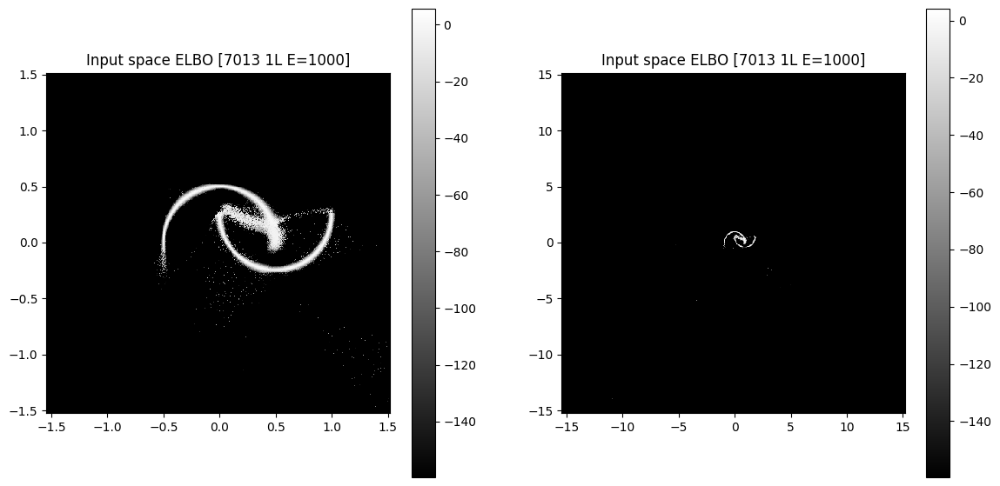

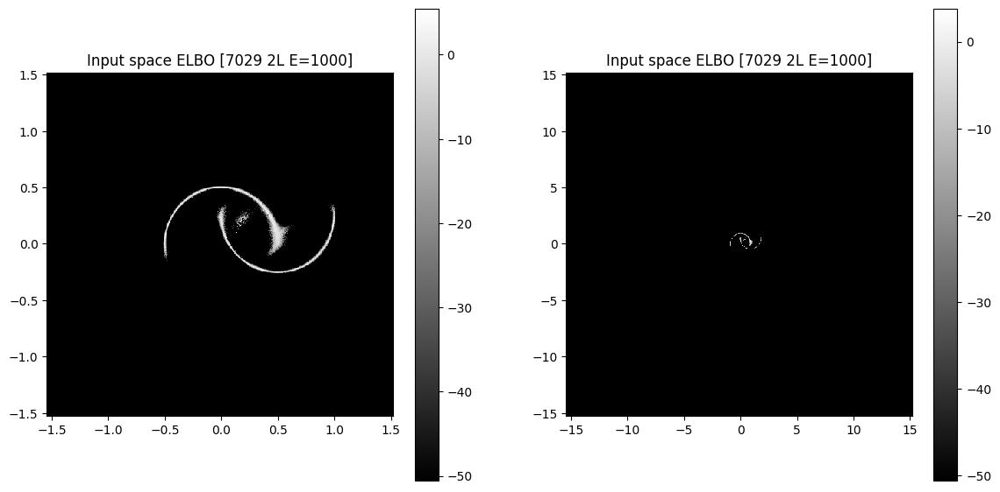

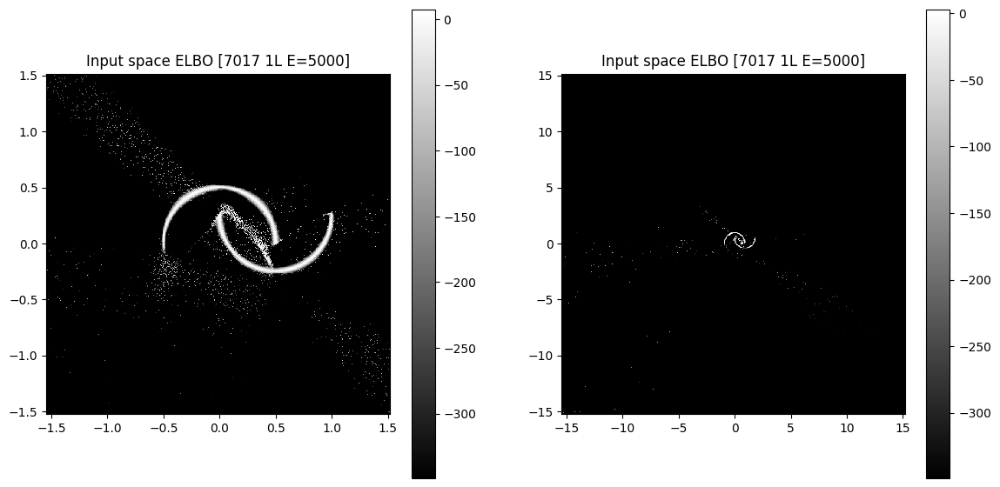

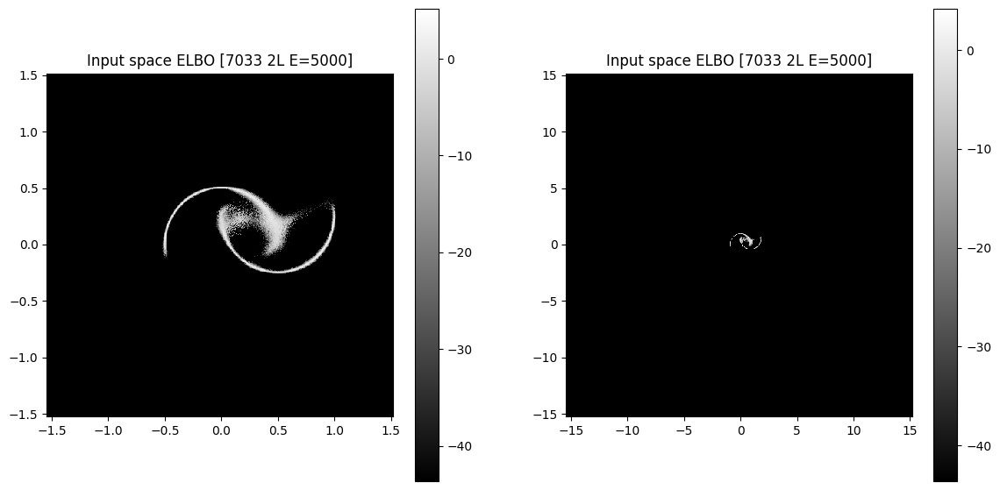

In [117]:
dataset = moons
models = models_moons

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
meshgrid = dataset['meshgrid']

for abbr, model in models.items():
    # Get limits from training set
    print(abbr)
    with torch.no_grad():
        elbo, _, _ = model.elbo(torch.FloatTensor(x_train), importance_samples=1)
        clip_min, clip_max = elbo.min(), elbo.max()

        # Compute ELBO on input space grid
        zv1 = compute_elbo_grid(model, (x_min, x_max), (y_min, y_max), zoom=1, importance_samples=1)
        zv10 = compute_elbo_grid(model, (x_min, x_max), (y_min, y_max), zoom=10, importance_samples=1)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
    img = ax1.imshow(zv1.clip(min=clip_min), mpl.cm.get_cmap('binary_r'), extent=(
        x_min - np.abs(x_min * 0),
        x_max + np.abs(x_max * 0),
        y_min - np.abs(y_min * 0),
        y_max + np.abs(y_max * 0)
    ))
    fig.colorbar(img, ax=ax1)
    ax1.set_title(f'Input space ELBO [{abbr}]')
    ax1.axis(aspect='image');
    
    img = ax2.imshow(zv10.clip(min=clip_min), mpl.cm.get_cmap('binary_r'), extent=(
        x_min - np.abs(x_min * 9),
        x_max + np.abs(x_max * 9),
        y_min - np.abs(y_min * 9),
        y_max + np.abs(y_max * 9)
    ))
    fig.colorbar(img, ax=ax2)
    ax2.set_title(f'Input space ELBO [{abbr}]')
    ax2.axis(aspect='image');

## OOD detection based on ELBO

### Moons

{'z1': True}
{'z1': True, 'z2': True}


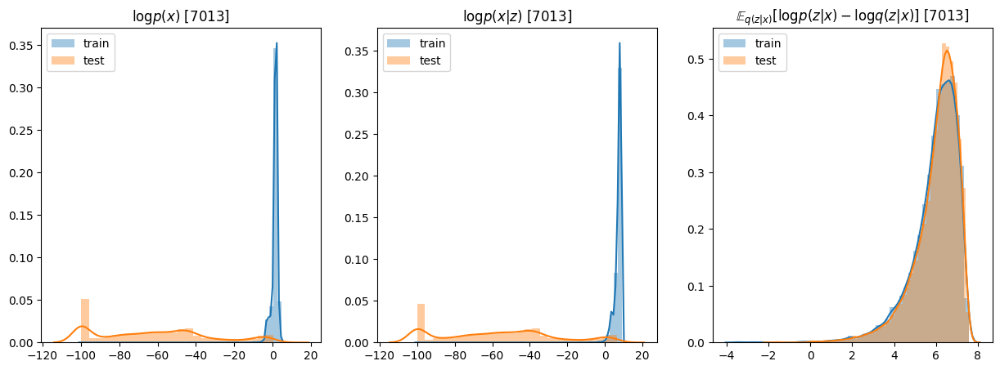

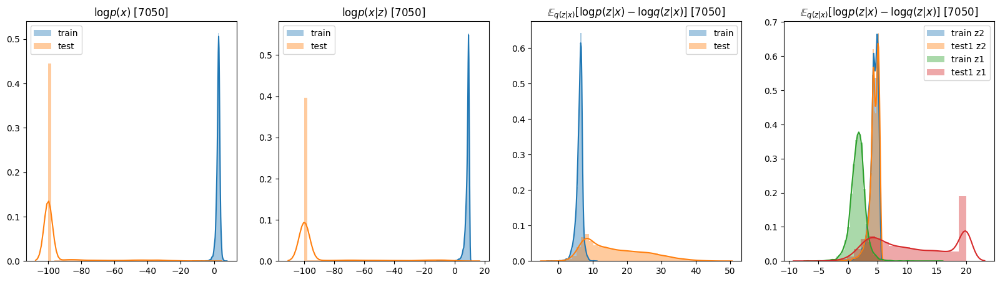

In [84]:
dataset = moons
models = models_moons

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
for abbr, model in models.items():
    with torch.no_grad():
        copy_latents = {f'z{i+1}': True for i in range(model.n_layers)}
        print(copy_latents)
        
        torch.manual_seed(0)
            
        elbo_train, likelihood_train, kl_train = model.elbo(torch.FloatTensor(x_train), importance_samples=1,
                                                            copy_latents=copy_latents)
        kls_train = model.kl_divergences
        elbo_test1, likelihood_test1, kl_test1 = model.elbo(torch.FloatTensor(x_test1), importance_samples=1,
                                                            copy_latents=copy_latents)
        kls_test1 = model.kl_divergences
    
    n_cols = int(len(model.kl_divergences) > 1) + 3
    if n_cols == 4:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, n_cols, figsize=((5 * n_cols, 5)))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(1, n_cols, figsize=((5 * n_cols, 5)))

    seaborn.distplot(elbo_train.clamp(-100), kde_kws={}, ax=ax1, label='train')
    seaborn.distplot(elbo_test1.clamp(-100), kde_kws={}, ax=ax1, label='test')
    seaborn.distplot(likelihood_train.clamp(-100), kde_kws={}, ax=ax2, label='train')
    seaborn.distplot(likelihood_test1.clamp(-100), kde_kws={}, ax=ax2, label='test')
    seaborn.distplot(kl_train, kde_kws={}, ax=ax3, label='train')
    seaborn.distplot(kl_test1, kde_kws={}, ax=ax3, label='test')

    if n_cols == 4:
        for (latent_key, _kl_train), (_, _kl_test1) in zip(reversed(kls_train.items()), reversed(kls_test1.items())):
            seaborn.distplot(_kl_train.clamp(max=20), kde_kws={}, ax=ax4, label=f'train {latent_key}')
            seaborn.distplot(_kl_test1.clamp(max=20), kde_kws={}, ax=ax4, label=f'test1 {latent_key}')

    ax1.set_title(f'$\log p(x)$ [{abbr.upper()}]')
    ax2.set_title(f'$\log p(x|z)$ [{abbr.upper()}]')
    ax3.set_title(f'$\mathbb{{E}}_{{q(z|x)}}[\log p(z|x) - \log q(z|x)]$ [{abbr.upper()}]')
    ax1.legend()
    ax2.legend()
    ax3.legend()
    if n_cols == 4:
        ax4.set_title(f'$\mathbb{{E}}_{{q(z|x)}}[\log p(z|x) - \log q(z|x)]$ [{abbr.upper()}]')
        ax4.legend()
        
    fig.savefig(output_dir + f'/Moons_OOD_ID{abbr}' + plot_ext, bbox_inches='tight')

### Spirals

{'z1': True}
{'z1': True, 'z2': True, 'z3': True}
{'z1': True}
{'z1': True, 'z2': True}


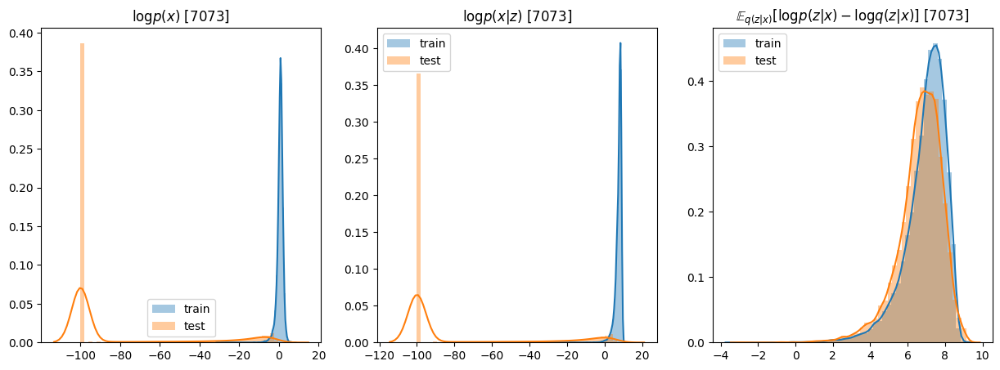

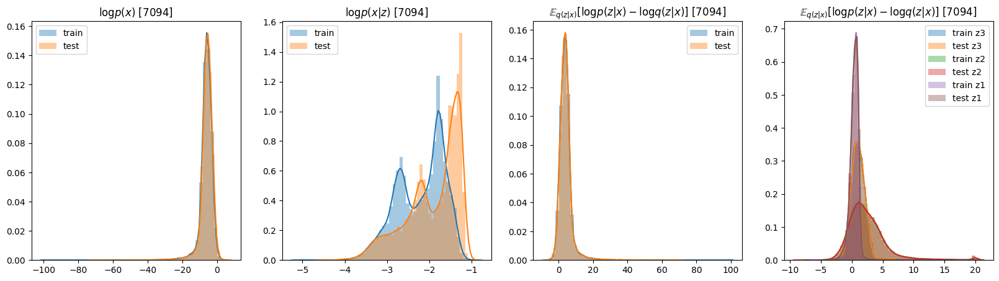

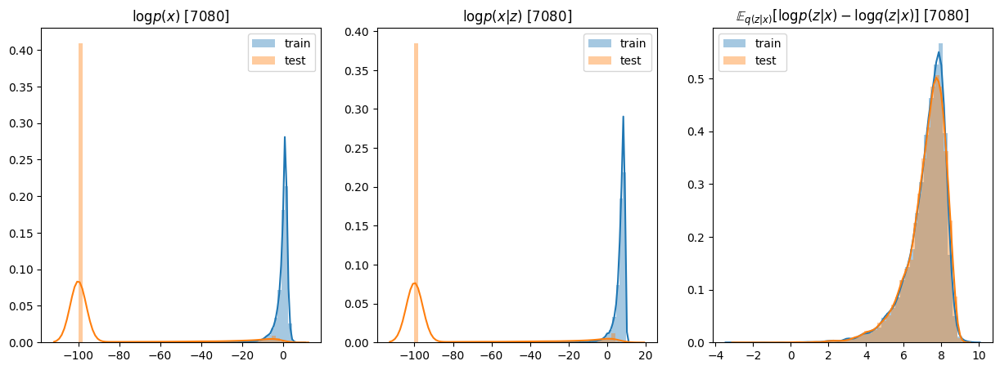

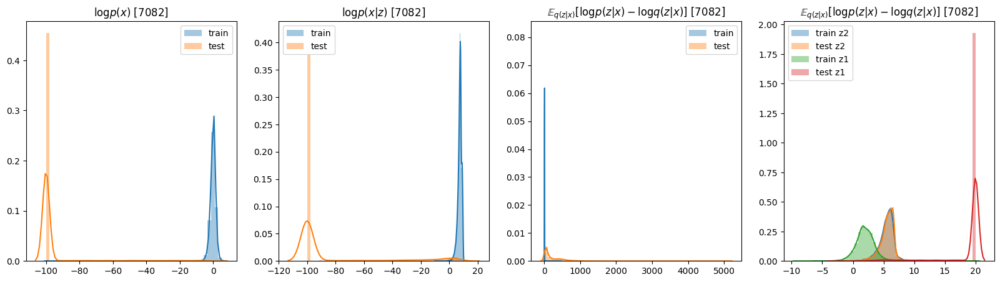

In [66]:
dataset = spirals
models = models_spirals

x_train, y_train = dataset['x_train'], dataset['y_train']
x_test1, y_test1 = dataset['x_test1'], dataset['y_test1']
for abbr, model in models.items():
    with torch.no_grad():
        copy_latents = {f'z{i+1}': True for i in range(model.n_layers)}
        print(copy_latents)
        
        torch.manual_seed(0)
            
        elbo_train, likelihood_train, kl_train = model.elbo(torch.FloatTensor(x_train), importance_samples=1,
                                                            copy_latents=copy_latents)
        kls_train = model.kl_divergences
        elbo_test1, likelihood_test1, kl_test1 = model.elbo(torch.FloatTensor(x_test1), importance_samples=1,
                                                            copy_latents=copy_latents)
        kls_test1 = model.kl_divergences
    
    n_cols = int(len(model.kl_divergences) > 1) + 3
    if n_cols == 4:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, n_cols, figsize=((5 * n_cols, 5)))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(1, n_cols, figsize=((5 * n_cols, 5)))

    seaborn.distplot(elbo_train.clamp(-100), kde_kws={}, ax=ax1, label='train')
    seaborn.distplot(elbo_test1.clamp(-100), kde_kws={}, ax=ax1, label='test')
    seaborn.distplot(likelihood_train.clamp(-100), kde_kws={}, ax=ax2, label='train')
    seaborn.distplot(likelihood_test1.clamp(-100), kde_kws={}, ax=ax2, label='test')
    seaborn.distplot(kl_train, kde_kws={}, ax=ax3, label='train')
    seaborn.distplot(kl_test1, kde_kws={}, ax=ax3, label='test')

    if n_cols == 4:
        for (latent_key, _kl_train), (_, _kl_test1) in zip(reversed(kls_train.items()), reversed(kls_test1.items())):
            seaborn.distplot(_kl_train.clamp(max=20), kde_kws={}, ax=ax4, label=f'train {latent_key}')
            seaborn.distplot(_kl_test1.clamp(max=20), kde_kws={}, ax=ax4, label=f'test {latent_key}')

    ax1.set_title(f'$\log p(x)$ [{abbr.upper()}]')
    ax2.set_title(f'$\log p(x|z)$ [{abbr.upper()}]')
    ax3.set_title(f'$\mathbb{{E}}_{{q(z|x)}}[\log p(z|x) - \log q(z|x)]$ [{abbr.upper()}]')
    ax1.legend()
    ax2.legend()
    ax3.legend()
    if n_cols == 4:
        ax4.set_title(f'$\mathbb{{E}}_{{q(z|x)}}[\log p(z|x) - \log q(z|x)]$ [{abbr.upper()}]')
        ax4.legend()
        
    fig.savefig(output_dir + f'/Spirals_OOD_ID{abbr}' + plot_ext, bbox_inches='tight')

## Animate generation during training

In [34]:
import matplotlib.pyplot as plt
import natsort

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [35]:
def get_substring_digit(s):
    return int(''.join([ss for ss in s if ss.isdigit()]))

def get_training_samples(run_id):
    npys = dict()
    for f in os.listdir(os.path.join(experiments_dir, str(run_id))):
        if f.endswith('model_samples.npy'):
            epoch = get_substring_digit(f)
            npys[epoch] = np.load(os.path.join(experiments_dir, str(run_id), f))
    return npys

def get_training_latents(run_id):
    npys = dict()
    for f in os.listdir(os.path.join(experiments_dir, str(run_id))):
        if f.endswith('model_latents.pkl'):
            epoch = get_substring_digit(f)
            npys[epoch] = torch.load(os.path.join(experiments_dir, str(run_id), f), map_location='cpu')
    return npys

In [38]:
run_id = '7094'
samples = get_training_samples(run_id)
latents = get_training_latents(run_id)
print(samples[0].shape)

(10000, 2)


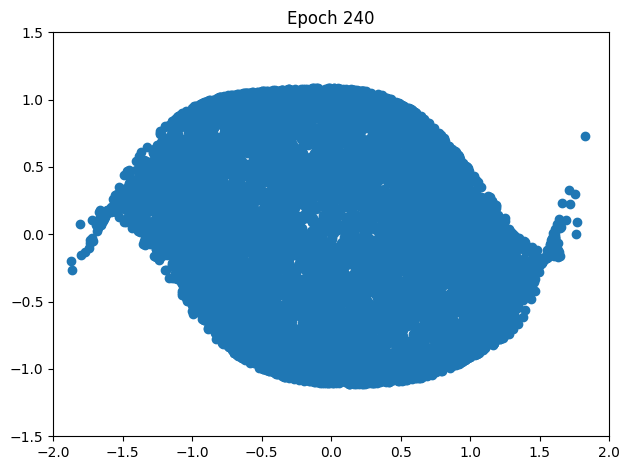

In [39]:
fig, ax = plt.subplots()
fig.set_tight_layout(True)
scat = ax.scatter([], [])

def init():
    return (scat, )

def update(i):
    scat.set_offsets(samples[i])
    ax.set_xlim([-2, 2])
    ax.set_ylim([-1.5, 1.5])
#    ax.set_xlim([-1.5, 2.5])  # Moons
#    ax.set_ylim([-1, 1.5])
    ax.set_title(f'Epoch {i}')
    return (scat, )
    
    
epochs_sorted = natsort.natsorted(samples.keys())
anim = FuncAnimation(fig,
                     update,
                     frames=[*epochs_sorted[:1]*10, *epochs_sorted, *epochs_sorted[-1:]*10], 
                     init_func=init,
                     interval=150,
                     blit=True)

HTML(anim.to_html5_video())

In [313]:
anim.save(output_dir + f'/training_samples_{run_id}.mp4', codec='h264')

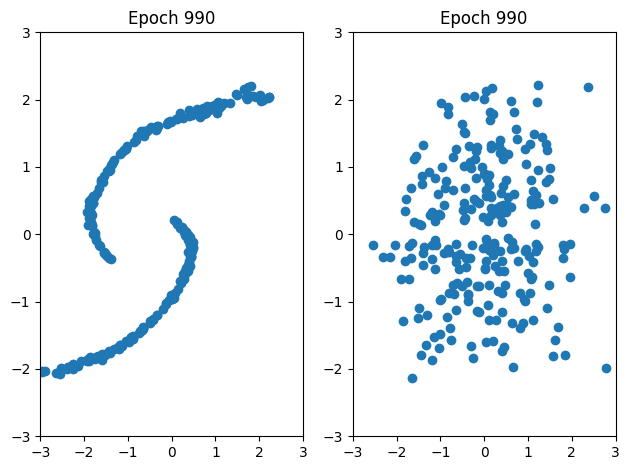

In [193]:
# latents[epoch]['z_index'][0]
n_latents = len(latents[0].keys())
fig, axes = plt.subplots(1, n_latents)
fig.set_tight_layout(True)
scatters = [ax.scatter([], []) for ax in axes]

def init():
    return scatters

def update(epoch):
    for j, z_index in enumerate(latents[epoch].keys()):
        scatters[j].set_offsets(latents[epoch][z_index][0].detach().view(-1, 2))  # epoch, latent name, samples (not distribution in 1)
        axes[j].set_xlim([-3, 3])
        axes[j].set_ylim([-3, 3])
        axes[j].set_title(f'Epoch {epoch}')
    return scatters
    
    
epochs_sorted = natsort.natsorted(latents.keys())
anim = FuncAnimation(fig,
                     update,
                     frames=[*epochs_sorted[:1]*10, *epochs_sorted, *epochs_sorted[-1:]*10], 
                     init_func=init,
                     interval=150,
                     blit=True)

HTML(anim.to_html5_video())

In [315]:
anim.save(f'encoded_latents_{run_id}.mp4', codec='h264')